### Import packages

In [182]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import copy
import math
import seaborn as sns

%matplotlib inline

In [183]:
!pip install ydata-profiling
from ydata_profiling import ProfileReport

### Read data

In [184]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [299]:
import pandas as pd

data = pd.read_csv(
    '/content/drive/MyDrive/Colab Notebooks/synthetic_covid_impact_on_work.csv',
    thousands=',',
    skipinitialspace=True
)
data.head(10)


,Increased_Work_Hours,Work_From_Home,Hours_Worked_Per_Day,Meetings_Per_Day,Productivity_Change,Stress_Level,Health_Issue,Job_Security,Childcare_Responsibilities,Commuting_Changes,Technology_Adaptation,Salary_Changes,Team_Collaboration_Challenges,Sector,Affected_by_Covid
0,1,1,6.392394,2.684594,1,Low,0,0,1,1,1,0,1,Retail,1
1,1,1,9.171984,3.339225,1,Low,0,1,0,1,1,0,1,IT,1
2,1,0,10.612561,2.218333,0,Medium,0,0,0,0,0,0,0,Retail,1
3,1,1,5.546169,5.150566,0,Medium,0,0,0,1,0,0,0,Education,1
4,0,1,11.424615,3.121126,1,Medium,0,1,1,1,0,1,1,Education,1
5,1,1,7.742898,-0.582977,1,Low,1,0,1,1,1,0,1,IT,1
6,0,0,6.049957,7.695664,0,Medium,0,0,1,0,1,0,1,IT,1
7,1,1,9.515510,3.144098,0,High,1,0,0,1,1,0,1,Healthcare,1
8,1,1,7.107091,3.135114,0,Medium,1,1,0,0,0,0,1,Education,1
9,1,1,7.836527,6.507418,0,High,1,0,1,1,1,0,1,Education,1


### Drop empty lines in data and remove NAN's

In [186]:
data = data.dropna() # reduce errors like : cannot convert NaN to float / unsuported operand with None
data

,Increased_Work_Hours,Work_From_Home,Hours_Worked_Per_Day,Meetings_Per_Day,Productivity_Change,Stress_Level,Health_Issue,Job_Security,Childcare_Responsibilities,Commuting_Changes,Technology_Adaptation,Salary_Changes,Team_Collaboration_Challenges,Sector,Affected_by_Covid
0,1,1,6.392394,2.684594,1,Low,0,0,1,1,1,0,1,Retail,1
1,1,1,9.171984,3.339225,1,Low,0,1,0,1,1,0,1,IT,1
2,1,0,10.612561,2.218333,0,Medium,0,0,0,0,0,0,0,Retail,1
3,1,1,5.546169,5.150566,0,Medium,0,0,0,1,0,0,0,Education,1
4,0,1,11.424615,3.121126,1,Medium,0,1,1,1,0,1,1,Education,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1,1,7.961822,2.283857,1,Medium,1,1,1,0,0,0,1,IT,1
9996,0,0,10.917086,3.621406,0,Medium,0,0,1,0,1,0,0,IT,1
9997,1,1,10.176211,1.039689,1,Low,0,1,0,1,1,1,1,Retail,1
9998,1,1,11.903973,3.756725,0,Medium,1,1,0,1,1,1,1,Education,1


### Reset the index for potentially removed rows in data

In [187]:
data = data.reset_index(drop=True)

## EDA - Exploratory Data Analysis

### View data statistics - short format

In [188]:
data.describe()

,Increased_Work_Hours,Work_From_Home,Hours_Worked_Per_Day,Meetings_Per_Day,Productivity_Change,Health_Issue,Job_Security,Childcare_Responsibilities,Commuting_Changes,Technology_Adaptation,Salary_Changes,Team_Collaboration_Challenges,Affected_by_Covid
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.0
mean,0.676900,0.803300,8.006538,3.976717,0.50220,0.301100,0.404900,0.396700,0.50220,0.605100,0.194800,0.700600,1.0
std,0.467684,0.397523,1.978468,1.521594,0.50002,0.458759,0.490897,0.489237,0.50002,0.488854,0.396066,0.458018,0.0
min,0.000000,0.000000,0.287249,-2.698406,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,1.0
25%,0.000000,1.000000,6.648484,2.924896,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,1.0
50%,1.000000,1.000000,8.010864,3.981344,1.00000,0.000000,0.000000,0.000000,1.00000,1.000000,0.000000,1.000000,1.0
75%,1.000000,1.000000,9.348860,5.024619,1.00000,1.000000,1.000000,1.000000,1.00000,1.000000,0.000000,1.000000,1.0
max,1.000000,1.000000,16.958169,9.591750,1.00000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.0


### View data statistics - long format

In [189]:
profile = ProfileReport(data, title="Synthetic COVID-19 impact on work")

In [190]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 15/15 [00:00<00:00, 27.79it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Important: We have 49.8% samples with no productivity change and 50.2% of samples with productivity change in our dataset

In [191]:
data['Meetings_Per_Day'] = data['Meetings_Per_Day'].clip(lower=0)


### Change categorical string/boolean columns to categorical integer columns

In [192]:
# Low, Medium, High -> 0, 1, 2
data['Stress_Level'] = data['Stress_Level'].astype('category').cat.codes
# IT, Healthcare, Education, Retail -> 0, 1, 2, 3
data['Sector'] = data['Sector'].astype('category').cat.codes


In [193]:
data

,Increased_Work_Hours,Work_From_Home,Hours_Worked_Per_Day,Meetings_Per_Day,Productivity_Change,Stress_Level,Health_Issue,Job_Security,Childcare_Responsibilities,Commuting_Changes,Technology_Adaptation,Salary_Changes,Team_Collaboration_Challenges,Sector,Affected_by_Covid
0,1,1,6.392394,2.684594,1,1,0,0,1,1,1,0,1,3,1
1,1,1,9.171984,3.339225,1,1,0,1,0,1,1,0,1,2,1
2,1,0,10.612561,2.218333,0,2,0,0,0,0,0,0,0,3,1
3,1,1,5.546169,5.150566,0,2,0,0,0,1,0,0,0,0,1
4,0,1,11.424615,3.121126,1,2,0,1,1,1,0,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1,1,7.961822,2.283857,1,2,1,1,1,0,0,0,1,2,1
9996,0,0,10.917086,3.621406,0,2,0,0,1,0,1,0,0,2,1
9997,1,1,10.176211,1.039689,1,1,0,1,0,1,1,1,1,3,1
9998,1,1,11.903973,3.756725,0,2,1,1,0,1,1,1,1,0,1


### Create x and y from original data

In [194]:
# features
x_data = data.drop(columns=['Productivity_Change','Affected_by_Covid'])
x_data

,Increased_Work_Hours,Work_From_Home,Hours_Worked_Per_Day,Meetings_Per_Day,Stress_Level,Health_Issue,Job_Security,Childcare_Responsibilities,Commuting_Changes,Technology_Adaptation,Salary_Changes,Team_Collaboration_Challenges,Sector
0,1,1,6.392394,2.684594,1,0,0,1,1,1,0,1,3
1,1,1,9.171984,3.339225,1,0,1,0,1,1,0,1,2
2,1,0,10.612561,2.218333,2,0,0,0,0,0,0,0,3
3,1,1,5.546169,5.150566,2,0,0,0,1,0,0,0,0
4,0,1,11.424615,3.121126,2,0,1,1,1,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1,1,7.961822,2.283857,2,1,1,1,0,0,0,1,2
9996,0,0,10.917086,3.621406,2,0,0,1,0,1,0,0,2
9997,1,1,10.176211,1.039689,1,0,1,0,1,1,1,1,3
9998,1,1,11.903973,3.756725,2,1,1,0,1,1,1,1,0


In [195]:
#target
y_data = data[['Productivity_Change']]
y_data

,Productivity_Change
0,1
1,1
2,0
3,0
4,1
...,...
9995,1
9996,0
9997,1
9998,0


### View features against Productivity_Change

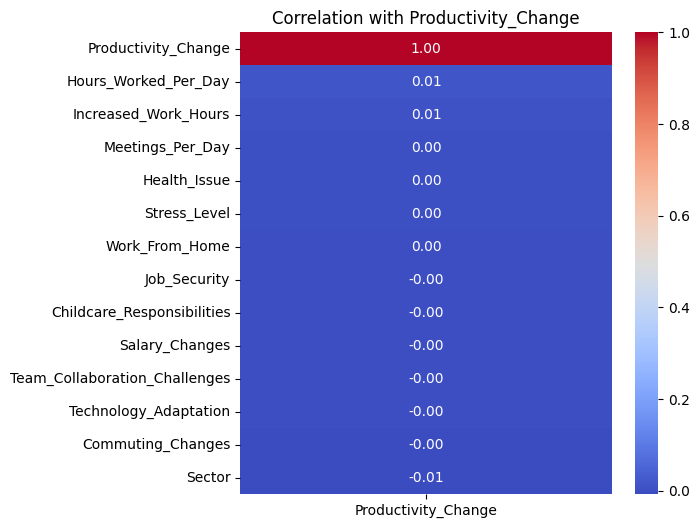

In [196]:
df2 = data.drop(columns=['Affected_by_Covid']).copy()

# corelatia completa - matrice
corr_full = df2.corr()

plt.figure(figsize=(6,6))
sns.heatmap(
    corr_full[['Productivity_Change']].sort_values('Productivity_Change', ascending=False),
    annot=True, fmt=".2f", cmap='coolwarm'
)
plt.title('Correlation with Productivity_Change')
plt.show()


### Split data into training and validation datasets: Default 80% train, 20% validation

In [197]:
x_train, x_validation, y_train, y_validation = train_test_split(x_data, y_data, test_size=0.2, random_state=42, stratify=y_data)

### Visualize how one sample looks like

In [198]:
x_train = x_train.to_numpy()
x_validation = x_validation.to_numpy()
y_train = y_train.to_numpy()
y_validation = y_validation.to_numpy()

In [199]:
x_train[0]

array([1.        , 1.        , 7.09632654, 1.40712434, 2.        ,
       0.        , 1.        , 0.        , 1.        , 0.        ,
       0.        , 0.        , 1.        ])

### Visualize the nuber of training samples and number of validation samples

In [200]:
len(y_train), len(y_validation)

(8000, 2000)

### Visualize the number of "no change" vs "change" samples in training dataset

#### We have approximately 49.8% samples with **no productivity change** (0) and 50.2% samples with **productivity change** (1) in our dataset  
#### ⇒ This is about a 1 : 1 class ratio  
#### ⇒ Our train/validation split (80/20 stratified) preserves this balance


In [300]:
# confirm counts in the training set
np.unique(y_train, return_counts=True)

(array([0, 1]), array([3982, 4018]))

#### 3982 samples of 0 (no change) and 4018 samples of 1 (change)



### Visualize the number of 'no change' vs 'change' samples in validation dataset

##We have **996 samples** of 0 (no change) and **1004 samples** of 1 (change) in our validation set  
###⇒ This is approximately **49.8%** vs **50.2%**  
###⇒ Our 80/20 stratified split has successfully preserved the original 1:1 class balance

In [301]:
np.unique(y_validation, return_counts=True)

(array([0, 1]), array([ 996, 1004]))

### Standardization - mean and standard deviation calculation

In [303]:
mean   = np.mean(x_train, axis=0)
sigma  = np.std(x_train, axis=0)

In [305]:
x_train = (x_train - mean) / sigma

### Very important! Validation dataset MUST BE standardized using mean and standard deviation calculated from the training dataset

In [306]:
x_validation = (x_validation - mean) / sigma

### View min and max values after standardization on the **training** dataset


In [307]:
x_train.min(), x_train.max()

(np.float64(-7.071062302353863), np.float64(4.625599528217893))

### View min and max values after standardization from training dataset

In [308]:
x_validation.min(), x_validation.max()

(np.float64(-3.258170591225563), np.float64(2.969827533577201))

### Logistic Regression implementation

In [309]:
def sigmoid(x):
    g = 1 / (1 + np.exp(-x))
    return g

#### Examples of using sigmoid values

In [209]:
sigmoid(1)

np.float64(0.7310585786300049)

In [210]:
sigmoid(0)

np.float64(0.5)

In [211]:
sigmoid(-1)

np.float64(0.2689414213699951)

In [212]:
sigmoid(-1000)

<ipython-input-208-0b81d26b1f5a>:2: RuntimeWarning: overflow encountered in exp
  g = 1 / (1 + np.exp(-x))


np.float64(0.0)

In [213]:
sigmoid(100)

np.float64(1.0)

In [214]:
import os
os.makedirs('model',exist_ok=True)

In [215]:
def compute_cost(X, y, w, b, lambda_=1):
    m = X.shape[0]
    cost = 0.0
    for i in range(m):
        z_i = np.dot(X[i],w) + b
        f_wb_i = sigmoid(z_i)
        cost +=  -y[i] * np.log(f_wb_i) - (1 - y[i]) * np.log(1 - f_wb_i)

    cost = cost / m
    return cost

In [216]:
def compute_gradient(X, y, w, b, lambda_=1):
    m,n = X.shape
    dj_dw = np.zeros((n,))                           #(n,)
    dj_db = 0.

    for i in range(m):
        f_wb_i = sigmoid(np.dot(X[i], w) + b)          #(n,)(n,)=scalar
        err_i  = f_wb_i  - y[i]                       #scalar
        for j in range(n):
            dj_dw[j] += float(err_i )* X[i,j]      #scalar
        dj_db += err_i
    dj_dw = dj_dw/m                                   #(n,)
    dj_db = dj_db/m                                   #scalar

    return dj_db, dj_dw

In [217]:
def gradient_descent(x_train, y_train, x_validation, y_validation, w_in, b_in, cost_function, gradient_function, alpha, num_iters, lambda_=1):
    # number of training examples
    m = len(x_train)

    # An array to store cost J and w's at each iteration primarily for graphing later
    J_train_history = []
    J_valid_history = []
    w_history = []

    best_train_score = cost_function(x_train, y_train, w_in, b_in, lambda_)
    best_validation_score = cost_valid =  compute_cost(x_validation, y_validation, w_in, b_in, lambda_)
    best_w_in_train = copy.deepcopy(w_in)
    best_b_train = copy.deepcopy(b_in)
    best_w_in_valid = copy.deepcopy(w_in)
    best_b_valid = copy.deepcopy(b_in)

    for i in range(num_iters):

        # Calculate the gradient and update the parameters
        dj_db, dj_dw = gradient_function(x_train, y_train, w_in, b_in, lambda_)

        # Update Parameters using w, b, alpha and gradient
        w_in = w_in - alpha * dj_dw
        b_in = b_in - alpha * dj_db

        cost_train =  cost_function(x_train, y_train, w_in, b_in, lambda_)
        J_train_history.append(cost_train)

        cost_valid =  compute_cost(x_validation, y_validation, w_in, b_in, lambda_)
        J_valid_history.append(cost_valid)

        if best_train_score > cost_train:
            best_train_score = cost_train
            best_w_in_train = w_in.copy()  # Copiază parametrii
            best_b_train = b_in

        if best_validation_score > cost_valid:
          best_validation_score = cost_valid
          best_w_in_valid = w_in.copy()
          best_b_valid = b_in
        # Print cost every at intervals 10 times or as many iterations if < 10
        if i % math.ceil(num_iters/10) == 0 or i == (num_iters-1):
            w_history.append(w_in)
            print(f"Iteration {i:4}: Cost Train: {float(J_train_history[-1].squeeze()):f} \t  Cost Validation: {float(J_valid_history[-1].squeeze()):f}")

    return w_in, b_in, J_train_history, J_valid_history, w_history , best_w_in_train, best_b_train, best_w_in_valid, best_b_valid #return w and J,w history for graphing

In [218]:
initial_w = np.zeros(x_train.shape[1])
initial_b = 0.0

# Some gradient descent settings
iterations = 100
alpha = 0.001# learning rate
lambda_ = 0

w_final, b_final, J_train_history, J_valid_history, w_history, \
    best_w_train, best_b_train, best_w_valid, best_b_valid = gradient_descent(
        x_train=x_train,
        y_train=y_train,
        x_validation=x_validation,
        y_validation=y_validation,
        w_in=initial_w,
        b_in=initial_b,
        cost_function=compute_cost,
        gradient_function=compute_gradient,
        alpha=alpha,
        num_iters=iterations,
        lambda_=lambda_
    )


<ipython-input-216-48f4e83a1fa6>:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  dj_dw[j] += float(err_i )* X[i,j]      #scalar


Iteration    0: Cost Train: 0.693147 	  Cost Validation: 0.693147
Iteration   10: Cost Train: 0.693146 	  Cost Validation: 0.693148
Iteration   20: Cost Train: 0.693144 	  Cost Validation: 0.693149
Iteration   30: Cost Train: 0.693143 	  Cost Validation: 0.693150
Iteration   40: Cost Train: 0.693142 	  Cost Validation: 0.693150
Iteration   50: Cost Train: 0.693140 	  Cost Validation: 0.693151
Iteration   60: Cost Train: 0.693139 	  Cost Validation: 0.693152
Iteration   70: Cost Train: 0.693138 	  Cost Validation: 0.693153
Iteration   80: Cost Train: 0.693137 	  Cost Validation: 0.693154
Iteration   90: Cost Train: 0.693135 	  Cost Validation: 0.693154
Iteration   99: Cost Train: 0.693134 	  Cost Validation: 0.693155


#### −(1×log(0.5) + 0×log(1−0.5)) = −log(0.5) ≃ 0.6931
#####Asta inseamnă ca orice model care „nu invata nimic” — pur si simplu predicand 50/50 — va avea un cost de aprox 0.693.




In [219]:
best_w_final = best_w_valid
best_b_final = best_b_valid

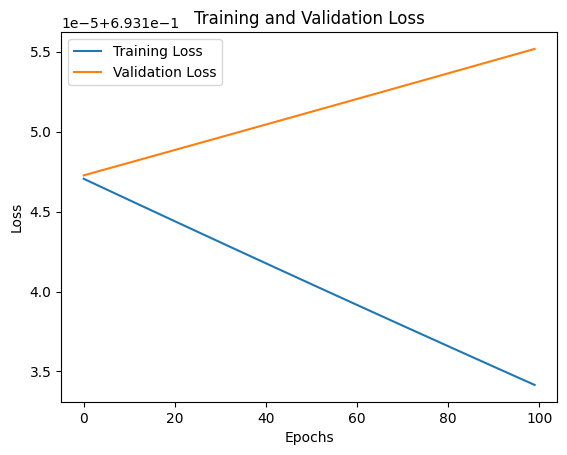

In [220]:
# Generate a sequence of integers to represent the epoch numbers
#epochs = range(1, iterations+1)

# Plot and label the training and validation loss values
plt.plot(J_train_history, label='Training Loss')
plt.plot(J_valid_history, label='Validation Loss')

# Add in a title and axes labels
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')

# Set the tick locations
#plt.xticks(np.arange(0, iterations+1, 2))

# Display the plot
plt.legend(loc='best')
plt.show()

In [221]:
def predict(X, w, b):
    # number of training examples
    m, n = X.shape
    p = np.zeros(m)

    for i in range(m):
        z_wb = 0
        # Loop over each feature
        for j in range(n):
            # Add the corresponding term to z_wb
            z_wb += X[i][j] * w[j]

        # Add bias term
        z_wb += b

        # Calculate the prediction for this example
        f_wb = sigmoid(z_wb)

        threshold = 0.5
        # Apply the threshold
        p[i] = f_wb >= threshold

    return p

In [222]:
y_predicted = predict(x_train, w_final, b_final)

<ipython-input-221-dc478c45c863>:21: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  p[i] = f_wb >= threshold


In [223]:
y_train.shape

(8000, 1)

In [224]:
y_train.reshape(-1).shape, y_predicted.shape

((8000,), (8000,))

In [225]:
(y_train.reshape(-1) == y_predicted).sum()

np.int64(4072)

In [226]:
x_train.shape
x_train.shape

(8000, 13)

In [227]:
y_train = y_train.reshape(-1)

In [228]:
type(y_predicted)

numpy.ndarray

In [229]:
def metrics_computations(x:np.array,
                         y_true:np.array,
                         y_predicted: np.array):
    total_number_of_samples = x.shape[0]
    accuracy = (y_true == y_predicted).sum() / total_number_of_samples
    true_positive = ((y_predicted == 1) & (y_true == 1)).sum()
    false_positive = ((y_predicted == 1) & (y_true == 0)).sum()
    false_negative = ((y_predicted == 0) & (y_true == 1)).sum()
    true_negative = ((y_predicted == 0) & (y_true == 0)).sum()

    precision = true_positive / (true_positive + false_positive)
    recall = true_positive / (true_positive + false_negative)
    specificity = true_negative / (true_negative + false_positive)
    f1_score = (2 * precision * recall) / (precision + recall)

    false_negative_rate = false_negative / (false_negative + true_positive)
    false_positive_rate = false_positive / (false_positive + true_negative)

    return (accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate)

In [230]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_train,
                                                                                                                     y_true=y_train,
                                                                                                                     y_predicted=y_predicted)

In [231]:
print(f"[TRAIN] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[TRAIN] Accuracy: 50.90% 
 Precision: 50.94% 
 Recall: 60.63% 
 F1 Score: 55.36% 
 Specificity: 41.08% 
 False Positive Rate: 58.92% 
 False Negative Rate: 39.37%


In [232]:
y_predicted_validation = predict(x_validation, w_final, b_final)

<ipython-input-221-dc478c45c863>:21: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  p[i] = f_wb >= threshold


In [233]:
y_validation = y_validation.reshape(-1)

In [234]:
for i, j in zip(y_validation, y_predicted_validation):
    print(i, j)

0 1.0
1 0.0
0 1.0
1 1.0
0 1.0
0 0.0
1 1.0
1 0.0
1 0.0
1 1.0
0 0.0
0 1.0
0 1.0
1 0.0
0 0.0
0 0.0
1 1.0
1 0.0
0 1.0
1 0.0
1 1.0
0 1.0
0 0.0
0 1.0
0 0.0
1 1.0
1 1.0
1 0.0
0 0.0
1 1.0
0 1.0
0 1.0
0 0.0
0 0.0
1 0.0
0 1.0
0 1.0
1 0.0
0 0.0
1 1.0
1 1.0
1 0.0
1 0.0
0 1.0
0 1.0
0 1.0
1 1.0
0 1.0
1 0.0
0 1.0
0 0.0
0 1.0
1 0.0
0 0.0
0 1.0
0 0.0
1 1.0
1 0.0
0 1.0
0 0.0
0 1.0
1 1.0
1 1.0
1 1.0
0 0.0
1 0.0
0 1.0
0 0.0
0 0.0
0 1.0
1 1.0
0 0.0
0 0.0
0 0.0
0 0.0
1 1.0
1 1.0
0 1.0
0 0.0
1 1.0
1 1.0
1 1.0
1 1.0
0 0.0
0 1.0
1 1.0
1 0.0
0 1.0
1 1.0
1 1.0
1 1.0
0 0.0
0 1.0
0 0.0
0 1.0
1 0.0
1 1.0
1 1.0
1 1.0
0 1.0
0 0.0
1 1.0
0 1.0
1 0.0
1 0.0
1 1.0
1 1.0
0 0.0
0 1.0
0 1.0
1 1.0
1 1.0
1 1.0
0 1.0
1 1.0
1 0.0
0 0.0
0 1.0
0 1.0
0 0.0
1 0.0
0 0.0
1 1.0
1 0.0
1 1.0
0 1.0
1 1.0
0 1.0
1 1.0
0 0.0
0 1.0
1 1.0
0 1.0
1 0.0
1 0.0
1 1.0
1 0.0
1 0.0
1 1.0
0 0.0
0 1.0
0 0.0
0 0.0
0 0.0
0 0.0
1 1.0
1 1.0
0 0.0
1 1.0
0 1.0
0 0.0
1 0.0
1 1.0
0 1.0
1 0.0
1 1.0
1 1.0
1 1.0
1 1.0
1 1.0
0 1.0
0 0.0
1 1.0
0 1.0
1 1.0
1 0.0
0 1.

In [235]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_validation,
                                                                                                                     y_true=y_validation,
                                                                                                                     y_predicted=y_predicted_validation)

In [236]:
print(f"[Valid] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[Valid] Accuracy: 49.20% 
 Precision: 49.51% 
 Recall: 59.86% 
 F1 Score: 54.19% 
 Specificity: 38.45% 
 False Positive Rate: 61.55% 
 False Negative Rate: 40.14%


### Analyze the feature importance

---

---





<Axes: ylabel='Feature'>

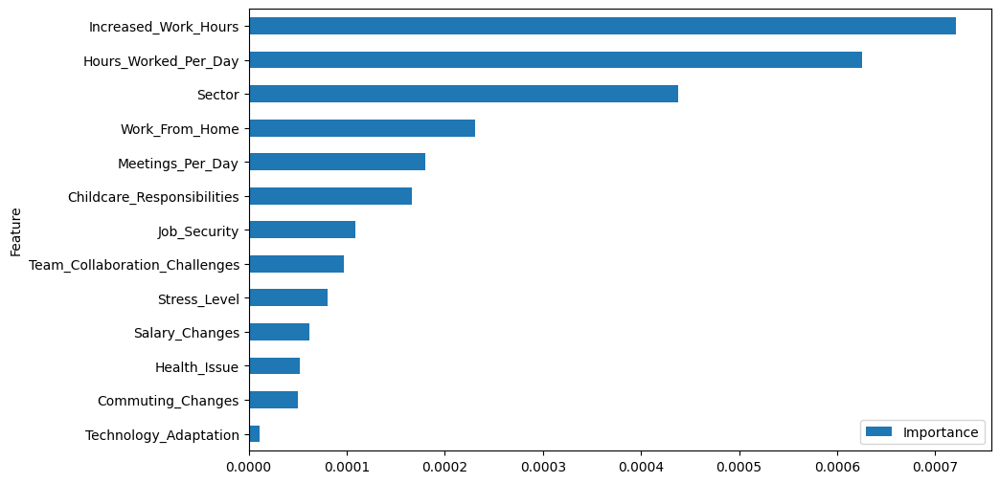

In [237]:
coefficients = copy.deepcopy(w_final)

feature_importance = pd.DataFrame({'Feature': x_data.columns.values, 'Importance': np.abs(coefficients)})
feature_importance = feature_importance.sort_values('Importance', ascending=True)
feature_importance.plot(x='Feature', y='Importance', kind='barh', figsize=(10, 6))

### Add polynomial features for improving model capacity

In [238]:
!pip install scikit-learn
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler

In [239]:
poly = preprocessing.PolynomialFeatures(2, interaction_only=False, include_bias=False)

In [240]:
x_data = data.drop(columns=['Productivity_Change','Affected_by_Covid'])
poly_values = poly.fit_transform(x_data)
poly_values

array([[ 1.        ,  1.        ,  6.39239364, ...,  1.        ,
         3.        ,  9.        ],
       [ 1.        ,  1.        ,  9.17198354, ...,  1.        ,
         2.        ,  4.        ],
       [ 1.        ,  0.        , 10.61256095, ...,  0.        ,
         0.        ,  9.        ],
       ...,
       [ 1.        ,  1.        , 10.17621059, ...,  1.        ,
         3.        ,  9.        ],
       [ 1.        ,  1.        , 11.90397286, ...,  1.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  8.44328419, ...,  1.        ,
         3.        ,  9.        ]])

In [241]:
poly_column_names = list(poly.get_feature_names_out(x_data.columns))
poly_column_names

['Increased_Work_Hours',
 'Work_From_Home',
 'Hours_Worked_Per_Day',
 'Meetings_Per_Day',
 'Stress_Level',
 'Health_Issue',
 'Job_Security',
 'Childcare_Responsibilities',
 'Commuting_Changes',
 'Technology_Adaptation',
 'Salary_Changes',
 'Team_Collaboration_Challenges',
 'Sector',
 'Increased_Work_Hours^2',
 'Increased_Work_Hours Work_From_Home',
 'Increased_Work_Hours Hours_Worked_Per_Day',
 'Increased_Work_Hours Meetings_Per_Day',
 'Increased_Work_Hours Stress_Level',
 'Increased_Work_Hours Health_Issue',
 'Increased_Work_Hours Job_Security',
 'Increased_Work_Hours Childcare_Responsibilities',
 'Increased_Work_Hours Commuting_Changes',
 'Increased_Work_Hours Technology_Adaptation',
 'Increased_Work_Hours Salary_Changes',
 'Increased_Work_Hours Team_Collaboration_Challenges',
 'Increased_Work_Hours Sector',
 'Work_From_Home^2',
 'Work_From_Home Hours_Worked_Per_Day',
 'Work_From_Home Meetings_Per_Day',
 'Work_From_Home Stress_Level',
 'Work_From_Home Health_Issue',
 'Work_From_Home 

In [242]:
x_data = pd.DataFrame(poly_values, columns=poly_column_names)
x_data

,Increased_Work_Hours,Work_From_Home,Hours_Worked_Per_Day,Meetings_Per_Day,Stress_Level,Health_Issue,Job_Security,Childcare_Responsibilities,Commuting_Changes,Technology_Adaptation,...,Technology_Adaptation^2,Technology_Adaptation Salary_Changes,Technology_Adaptation Team_Collaboration_Challenges,Technology_Adaptation Sector,Salary_Changes^2,Salary_Changes Team_Collaboration_Challenges,Salary_Changes Sector,Team_Collaboration_Challenges^2,Team_Collaboration_Challenges Sector,Sector^2
0,1.0,1.0,6.392394,2.684594,1.0,0.0,0.0,1.0,1.0,1.0,...,1.0,0.0,1.0,3.0,0.0,0.0,0.0,1.0,3.0,9.0
1,1.0,1.0,9.171984,3.339225,1.0,0.0,1.0,0.0,1.0,1.0,...,1.0,0.0,1.0,2.0,0.0,0.0,0.0,1.0,2.0,4.0
2,1.0,0.0,10.612561,2.218333,2.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0
3,1.0,1.0,5.546169,5.150566,2.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,1.0,11.424615,3.121126,2.0,0.0,1.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1.0,1.0,7.961822,2.283857,2.0,1.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,4.0
9996,0.0,0.0,10.917086,3.621406,2.0,0.0,0.0,1.0,0.0,1.0,...,1.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,4.0
9997,1.0,1.0,10.176211,1.039689,1.0,0.0,1.0,0.0,1.0,1.0,...,1.0,1.0,1.0,3.0,1.0,1.0,3.0,1.0,3.0,9.0
9998,1.0,1.0,11.903973,3.756725,2.0,1.0,1.0,0.0,1.0,1.0,...,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0


In [243]:
x_data.columns

Index(['Increased_Work_Hours', 'Work_From_Home', 'Hours_Worked_Per_Day',
       'Meetings_Per_Day', 'Stress_Level', 'Health_Issue', 'Job_Security',
       'Childcare_Responsibilities', 'Commuting_Changes',
       'Technology_Adaptation',
       ...
       'Technology_Adaptation^2', 'Technology_Adaptation Salary_Changes',
       'Technology_Adaptation Team_Collaboration_Challenges',
       'Technology_Adaptation Sector', 'Salary_Changes^2',
       'Salary_Changes Team_Collaboration_Challenges', 'Salary_Changes Sector',
       'Team_Collaboration_Challenges^2',
       'Team_Collaboration_Challenges Sector', 'Sector^2'],
      dtype='object', length=104)

### Split data into training and validation datasets: Default 80% train, 20% validation

In [244]:
x_train, x_validation, y_train, y_validation = train_test_split(x_data, y_data, test_size=0.2, random_state=42, stratify=y_data)

In [245]:
x_train = x_train.to_numpy()
x_validation = x_validation.to_numpy()
y_train = y_train.to_numpy()
y_validation = y_validation.to_numpy()

### Visualize how one sample looks like

In [246]:
x_train[0]

array([ 1.        ,  1.        ,  7.09632654,  1.40712434,  2.        ,
        0.        ,  1.        ,  0.        ,  1.        ,  0.        ,
        0.        ,  0.        ,  1.        ,  1.        ,  1.        ,
        7.09632654,  1.40712434,  2.        ,  0.        ,  1.        ,
        0.        ,  1.        ,  0.        ,  0.        ,  0.        ,
        1.        ,  1.        ,  7.09632654,  1.40712434,  2.        ,
        0.        ,  1.        ,  0.        ,  1.        ,  0.        ,
        0.        ,  0.        ,  1.        , 50.35785041,  9.98541378,
       14.19265309,  0.        ,  7.09632654,  0.        ,  7.09632654,
        0.        ,  0.        ,  0.        ,  7.09632654,  1.9799989 ,
        2.81424867,  0.        ,  1.40712434,  0.        ,  1.40712434,
        0.        ,  0.        ,  0.        ,  1.40712434,  4.        ,
        0.        ,  2.        ,  0.        ,  2.        ,  0.        ,
        0.        ,  0.        ,  2.        ,  0.        ,  0.  

### Visualize the nuber of training samples and number of validation samples

In [247]:
len(y_train), len(y_validation)

(8000, 2000)

### Visualize the number of no change vs change samples in training

1.   List item
2.   List item

dataset

#### Having 49.8% samples with no churn and 50.2% samples with churn in our dataset
#### So we have a ratio of 1 no change samples to 1 change sample (1:1 )
#### Our training and validation dataset should respect this ratio approximately

In [248]:
np.unique(y_train, return_counts=True)

(array([0, 1]), array([3982, 4018]))

#### 3982 samples of 0 (no change) and 4018 samples of 1 (change)
#### 78 * 6 = 468

### Visualize the number of no churn vs churn samples in validation dataset

#### 996 samples of 0 (no chnage) and 1004 samples of 1 (change)
#### 17 * 6 = 102

In [249]:
np.unique(y_validation, return_counts=True)

(array([0, 1]), array([ 996, 1004]))

### Standardization - mean and standard deviation calculation

In [250]:
mean   = np.mean(x_train, axis=0)
sigma  = np.std(x_train, axis=0)

In [251]:
x_train = (x_train - mean) / sigma

### Very important! Validation dataset MUST BE standardized using mean and standard deviation calculated from the training dataset

In [252]:
x_validation = (x_validation - mean) / sigma

### View min and max values after standardization from training dataset

In [253]:
x_train.min(), x_train.max()

(np.float64(-3.910465983798664), np.float64(6.833176252462758))

### View min and max values after standardization from training dataset

In [254]:
x_validation.min(), x_validation.max()

(np.float64(-3.258170591225574), np.float64(4.247301806501244))

### Train with polynomial features

In [255]:
def gradient_descent(x_train, y_train, x_validation, y_validation, w_in, b_in, cost_function, gradient_function, alpha, num_iters, lambda_=1):
    # number of training examples
    m = len(x_train)

    # An array to store cost J and w's at each iteration primarily for graphing later
    J_train_history = []
    J_valid_history = []
    w_history = []

    best_train_score = cost_function(x_train, y_train, w_in, b_in, lambda_)
    best_validation_score = cost_valid =  compute_cost(x_validation, y_validation, w_in, b_in, lambda_)
    best_w_in_train = copy.deepcopy(w_in)
    best_b_train = copy.deepcopy(b_in)
    best_w_in_valid = copy.deepcopy(w_in)
    best_b_valid = copy.deepcopy(b_in)

    for i in range(num_iters):

        # Calculate the gradient and update the parameters
        dj_db, dj_dw = gradient_function(x_train, y_train, w_in, b_in, lambda_)

        # Update Parameters using w, b, alpha and gradient
        w_in = w_in - alpha * dj_dw
        b_in = b_in - alpha * dj_db

        cost_train =  cost_function(x_train, y_train, w_in, b_in, lambda_)
        J_train_history.append(cost_train)

        cost_valid =  compute_cost(x_validation, y_validation, w_in, b_in, lambda_)
        J_valid_history.append(cost_valid)

        if best_train_score > cost_train:
            best_train_score = cost_train
            np.save(f'model/best_poly_train_w_in.npy', w_in)    # .npy extension is added if not given
            np.save(f'model/best_poly_train_b.npy', b_in)


        if best_validation_score > cost_valid:
            best_validation_score = cost_valid
            np.save(f'model/best_poly_valid_w_in.npy', w_in)    # .npy extension is added if not given
            np.save(f'model/best_poly_valid_b.npy', b_in)

        # Print cost every at intervals 10 times or as many iterations if < 10
        if i % math.ceil(num_iters/10) == 0 or i == (num_iters-1):
            w_history.append(w_in)
            print(f"Iteration {i:4}: Cost Train: {float(J_train_history[-1].squeeze()):f} \t  Cost Validation: {float(J_valid_history[-1].squeeze()):f}")

    return w_in, b_in, J_train_history, J_valid_history, w_history #return w and J,w history for graphing

In [256]:
initial_w = np.zeros(len(x_train[0]))
initial_b = 0

# Some gradient descent settings
iterations = 10
alpha = 0.05
lambda_ = 0

w_final, b_final, J_train_history, J_valid_history, _ = gradient_descent(x_train=x_train, y_train=y_train, x_validation=x_validation, y_validation=y_validation, w_in=initial_w, b_in=initial_b, cost_function=compute_cost, gradient_function=compute_gradient, alpha=alpha, num_iters=iterations, lambda_=lambda_)

<ipython-input-216-48f4e83a1fa6>:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  dj_dw[j] += float(err_i )* X[i,j]      #scalar


Iteration    0: Cost Train: 0.693084 	  Cost Validation: 0.693178
Iteration    1: Cost Train: 0.693027 	  Cost Validation: 0.693209
Iteration    2: Cost Train: 0.692974 	  Cost Validation: 0.693240
Iteration    3: Cost Train: 0.692925 	  Cost Validation: 0.693270
Iteration    4: Cost Train: 0.692880 	  Cost Validation: 0.693298
Iteration    5: Cost Train: 0.692837 	  Cost Validation: 0.693326
Iteration    6: Cost Train: 0.692797 	  Cost Validation: 0.693353
Iteration    7: Cost Train: 0.692759 	  Cost Validation: 0.693378
Iteration    8: Cost Train: 0.692723 	  Cost Validation: 0.693402
Iteration    9: Cost Train: 0.692688 	  Cost Validation: 0.693425


In [257]:
best_poly_w_final = w_final
best_poly_b_final = b_final

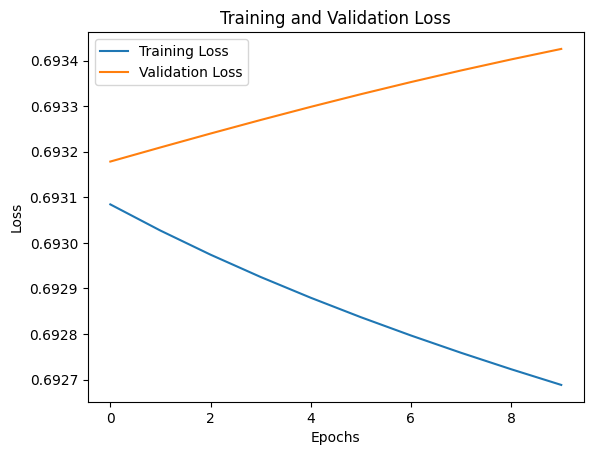

In [258]:
# Generate a sequence of integers to represent the epoch numbers
#epochs = range(1, iterations+1)

# Plot and label the training and validation loss values
plt.plot(J_train_history, label='Training Loss')
plt.plot(J_valid_history, label='Validation Loss')

# Add in a title and axes labels
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')

# Set the tick locations
#plt.xticks(np.arange(0, iterations+1, 2))

# Display the plot
plt.legend(loc='best')
plt.show()

In [259]:
def predict(X, w, b):
    # number of training examples
    m, n = X.shape
    p = np.zeros(m)

    for i in range(m):
        z_wb = 0
        # Loop over each feature
        for j in range(n):
            # Add the corresponding term to z_wb
            z_wb += X[i][j] * w[j]

        # Add bias term
        z_wb += b

        # Calculate the prediction for this example
        f_wb = sigmoid(z_wb)

        # Apply the threshold
        p[i] = f_wb >= 0.4

    return p

In [260]:
y_predicted = predict(x_train, w_final, b_final)

<ipython-input-259-8f4254b8db0a>:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  p[i] = f_wb >= 0.4


In [261]:
y_train.shape

(8000, 1)

In [262]:
y_train.reshape(-1).shape, y_predicted.shape

((8000,), (8000,))

In [263]:
(y_train.reshape(-1) == y_predicted).sum()

np.int64(4018)

In [264]:
y_train = y_train.reshape(-1)

In [265]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_train,
                                                                                                                     y_true=y_train,
                                                                                                                     y_predicted=y_predicted)

In [266]:
print(f"[TRAIN] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[TRAIN] Accuracy: 50.22% 
 Precision: 50.22% 
 Recall: 100.00% 
 F1 Score: 66.87% 
 Specificity: 0.00% 
 False Positive Rate: 100.00% 
 False Negative Rate: 0.00%


In [267]:
y_predicted_validation = predict(x_validation, w_final, b_final)

<ipython-input-259-8f4254b8db0a>:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  p[i] = f_wb >= 0.4


In [268]:
y_validation = y_validation.reshape(-1)

In [269]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_validation,
                                                                                                                     y_true=y_validation,
                                                                                                                     y_predicted=y_predicted_validation)

In [270]:
print(f"[VALID] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[VALID] Accuracy: 50.20% 
 Precision: 50.20% 
 Recall: 100.00% 
 F1 Score: 66.84% 
 Specificity: 0.00% 
 False Positive Rate: 100.00% 
 False Negative Rate: 0.00%


### Analyze the feature importance

<Axes: ylabel='Feature'>

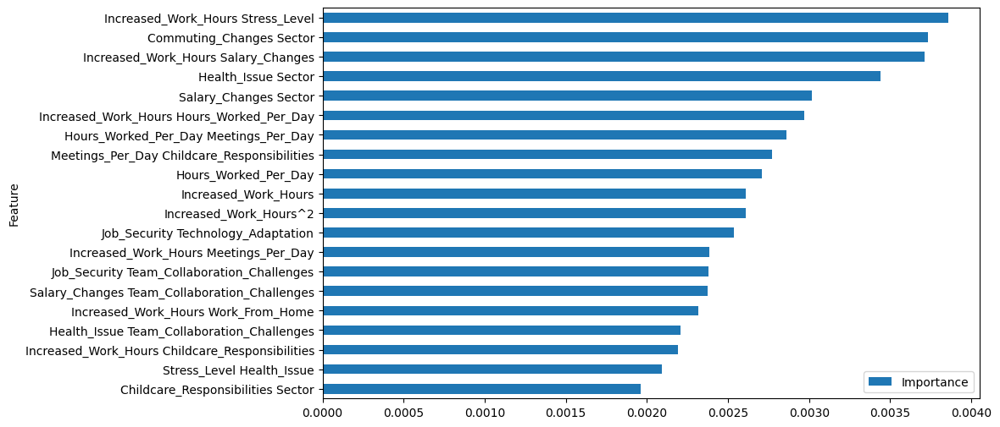

In [271]:
coefficients = copy.deepcopy(w_final)

feature_importance = pd.DataFrame({'Feature': x_data.columns.values, 'Importance': np.abs(coefficients)})
feature_importance = feature_importance.sort_values('Importance', ascending=True)
feature_importance.tail(20).plot(x='Feature', y='Importance', kind='barh', figsize=(10, 6))

#### For example most important feature is obtained by multipling two features: Total day minutes and Customer service calls

### Decision Tree
#### Specialized in learning non-linear data
#### No need for Normalization/Standardization
#### No need for Polynomial Feature Transformation

In [272]:
x_data = data.drop(columns=['Productivity_Change','Affected_by_Covid'])
y_data = data['Productivity_Change']


### Split data into training and validation datasets: Default 80% train, 20% validation

In [273]:
x_train, x_validation, y_train, y_validation = train_test_split(x_data, y_data, test_size=0.2, random_state=42, stratify=y_data)

In [274]:
x_train = x_train.to_numpy()
x_validation = x_validation.to_numpy()
y_train = y_train.to_numpy()
y_validation = y_validation.to_numpy()

### Visualize how one sample looks like

In [275]:
x_train[0]

array([1.        , 1.        , 7.09632654, 1.40712434, 2.        ,
       0.        , 1.        , 0.        , 1.        , 0.        ,
       0.        , 0.        , 1.        ])

### Visualize the nuber of training samples and number of validation samples

In [276]:
len(y_train), len(y_validation)

(8000, 2000)

### Visualize the number of no churn vs churn samples in training dataset

#### Having 85.8% samples with no churn and 14.2% samples with churn in our dataset
#### So we have a ratio of 6 no churn samples to 1 churn sample
#### Our training and validation dataset should respect this ratio approximately

In [277]:
np.unique(y_train, return_counts=True)

(array([0, 1]), array([3982, 4018]))

#### 456 samples of 0 (no churn) and 78 samples of 1 (churn)
#### 78 * 6 = 468

### Visualize the number of no churn vs churn samples in validation dataset

#### 116 samples of 0 (no churn) and 17 samples of 1 (churn)
#### 17 * 6 = 102

In [278]:
np.unique(y_validation, return_counts=True)

(array([0, 1]), array([ 996, 1004]))

In [279]:
from sklearn.tree import DecisionTreeClassifier, export_text
from sklearn.metrics import accuracy_score

### Decision Tree Code and Implementation

#### Declare Decision Tree with corresponding Hyperparameters

In [280]:
classifier = DecisionTreeClassifier(
    criterion='entropy',
    max_depth=7,
    min_samples_split=2,
    min_samples_leaf=1,
    random_state=42
)

### Testare manuala pt Decision Tree
Am rulat un loop pe:
- max_depth: [3, 5, 7, 10]  
- min_samples_split: [2, 5, 10]  
- min_samples_leaf: [1, 2, 5]  

Fiecare combinatie a fost antrenată pe x_train și evaluată pe x_validation cu metrics_computations.  
Am decis sa lucrez cu :  **max_depth=7**, **min_samples_split=2**, **min_samples_leaf=1**, care a dat **val_accuracy=52.95%**.


In [281]:
type(x_train)

numpy.ndarray

#### Train the Decision Tree

In [282]:
classifier.fit(x_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=7, random_state=42)

#### Predict on the training dataset

In [283]:
y_predicted = classifier.predict(x_train)
y_predicted = np.array(y_predicted)

### Display training metrics

In [284]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_train,
                                                                                                                     y_true=y_train.reshape(-1),
                                                                                                                     y_predicted=y_predicted)

In [285]:
print(f"[TRAIN] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[TRAIN] Accuracy: 54.60% 
 Precision: 55.96% 
 Recall: 45.10% 
 F1 Score: 49.94% 
 Specificity: 64.19% 
 False Positive Rate: 35.81% 
 False Negative Rate: 54.90%


### Display validation metrics

In [286]:
y_predicted_valid = classifier.predict(x_validation)
y_predicted_valid = np.array(y_predicted_valid)

In [287]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_validation,
                                                                                                                     y_true=y_validation.reshape(-1),
                                                                                                                     y_predicted=y_predicted_valid)

In [288]:
print(f"[VALID] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[VALID] Accuracy: 52.95% 
 Precision: 53.80% 
 Recall: 44.42% 
 F1 Score: 48.66% 
 Specificity: 61.55% 
 False Positive Rate: 38.45% 
 False Negative Rate: 55.58%


### Display Decision Tree and Learned rules by the Tree

In [289]:
list(x_data.columns)

['Increased_Work_Hours',
 'Work_From_Home',
 'Hours_Worked_Per_Day',
 'Meetings_Per_Day',
 'Stress_Level',
 'Health_Issue',
 'Job_Security',
 'Childcare_Responsibilities',
 'Commuting_Changes',
 'Technology_Adaptation',
 'Salary_Changes',
 'Team_Collaboration_Challenges',
 'Sector']

In [290]:
from sklearn.tree import plot_tree


In [291]:
fig, axes = plt.subplots(nrows = 1,ncols = 1, figsize=(70,50), dpi=300)
plot_tree(classifier, filled=True, fontsize=20, feature_names=list(x_data.columns),rounded=True, ax=axes)
plt.savefig('decisionTree.png')

In [292]:
text_representation = export_text(classifier, feature_names=list(x_data.columns), class_names=['No Churn', 'Churn'])
print(text_representation)

|--- Meetings_Per_Day <= 7.42
|   |--- Meetings_Per_Day <= 4.44
|   |   |--- Meetings_Per_Day <= 2.23
|   |   |   |--- Hours_Worked_Per_Day <= 6.60
|   |   |   |   |--- Hours_Worked_Per_Day <= 3.93
|   |   |   |   |   |--- Team_Collaboration_Challenges <= 0.50
|   |   |   |   |   |   |--- Hours_Worked_Per_Day <= 3.64
|   |   |   |   |   |   |   |--- class: Churn
|   |   |   |   |   |   |--- Hours_Worked_Per_Day >  3.64
|   |   |   |   |   |   |   |--- class: No Churn
|   |   |   |   |   |--- Team_Collaboration_Challenges >  0.50
|   |   |   |   |   |   |--- Hours_Worked_Per_Day <= 1.51
|   |   |   |   |   |   |   |--- class: Churn
|   |   |   |   |   |   |--- Hours_Worked_Per_Day >  1.51
|   |   |   |   |   |   |   |--- class: No Churn
|   |   |   |   |--- Hours_Worked_Per_Day >  3.93
|   |   |   |   |   |--- Meetings_Per_Day <= 2.16
|   |   |   |   |   |   |--- Meetings_Per_Day <= 1.07
|   |   |   |   |   |   |   |--- class: Churn
|   |   |   |   |   |   |--- Meetings_Per_Day >  1.07


In [293]:
from sklearn.tree import _tree

In [294]:
def get_rules(tree, feature_names, class_names):
    tree_ = tree.tree_
    feature_name = [
        feature_names[i] if i != _tree.TREE_UNDEFINED else "undefined!"
        for i in tree_.feature
    ]

    paths = []
    path = []

    def recurse(node, path, paths):

        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_name[node]
            threshold = tree_.threshold[node]
            p1, p2 = list(path), list(path)
            p1 += [f"({name} <= {np.round(threshold, 3)})"]
            recurse(tree_.children_left[node], p1, paths)
            p2 += [f"({name} > {np.round(threshold, 3)})"]
            recurse(tree_.children_right[node], p2, paths)
        else:
            path += [(tree_.value[node], tree_.n_node_samples[node])]
            paths += [path]

    recurse(0, path, paths)

    # sort by samples count
    samples_count = [p[-1][1] for p in paths]
    ii = list(np.argsort(samples_count))
    paths = [paths[i] for i in reversed(ii)]

    rules = []
    for path in paths:
        rule = "if "

        for p in path[:-1]:
            if rule != "if ":
                rule += " and "
            rule += str(p)
        rule += " then "
        if class_names is None:
            rule += "response: "+str(np.round(path[-1][0][0][0],3))
        else:
            classes = path[-1][0][0]
            l = np.argmax(classes)
            rule += f"class: {class_names[l]} (proba: {np.round(100.0*classes[l]/np.sum(classes),2)}%)"
        rule += f" | based on {path[-1][1]:,} samples"
        rules += [rule]

    return rules

In [295]:
rules = get_rules(classifier, feature_names=list(x_data.columns), class_names=['No Churn', 'Churn'])
for r in rules:
    print(r)

if (Meetings_Per_Day <= 7.425) and (Meetings_Per_Day <= 4.44) and (Meetings_Per_Day > 2.232) and (Meetings_Per_Day > 2.322) and (Meetings_Per_Day > 2.328) and (Hours_Worked_Per_Day > 4.672) and (Hours_Worked_Per_Day > 4.692) then class: No Churn (proba: 51.3%) | based on 3,665 samples
if (Meetings_Per_Day <= 7.425) and (Meetings_Per_Day > 4.44) and (Meetings_Per_Day > 5.007) and (Meetings_Per_Day > 5.012) and (Meetings_Per_Day <= 7.368) and (Hours_Worked_Per_Day > 6.812) and (Hours_Worked_Per_Day > 6.85) then class: Churn (proba: 51.94%) | based on 1,390 samples
if (Meetings_Per_Day <= 7.425) and (Meetings_Per_Day > 4.44) and (Meetings_Per_Day <= 5.007) and (Meetings_Per_Day <= 5.001) and (Meetings_Per_Day > 4.443) and (Hours_Worked_Per_Day <= 10.314) and (Hours_Worked_Per_Day <= 10.09) then class: Churn (proba: 55.5%) | based on 818 samples
if (Meetings_Per_Day <= 7.425) and (Meetings_Per_Day > 4.44) and (Meetings_Per_Day > 5.007) and (Meetings_Per_Day > 5.012) and (Meetings_Per_Day <

In [296]:
def eval_tree(max_depth, min_samples_split, min_samples_leaf):
    # 1) Instanţiezi arborele cu parametrii propuşi
    clf = DecisionTreeClassifier(
        criterion='entropy',
        max_depth = max_depth,
        min_samples_split = min_samples_split,
        min_samples_leaf = min_samples_leaf,
        random_state = 42
    )
    # 2) Antrenezi
    clf.fit(x_train, y_train.ravel())
    # 3) Predici pe validare
    y_val_pred = clf.predict(x_validation)
    # 4) Calculezi acurateţea (sau orice metrică vrei)
    accuracy, *_ = metrics_computations(
        x=x_validation,
        y_true=y_validation.ravel(),
        y_predicted=y_val_pred
    )
    return accuracy, clf


In [297]:
candidates = []
for depth in [3, 5, 7, 10, None]:
    for split in [2, 5, 10]:
        for leaf in [1, 2, 5]:
            acc, model = eval_tree(depth, split, leaf)
            candidates.append({
                'max_depth': depth,
                'min_samples_split': split,
                'min_samples_leaf': leaf,
                'val_accuracy': acc,
                'model': model
            })

# Transform în DataFrame pentru a vedea toate rezultatele ordonate
import pandas as pd
df_cand = pd.DataFrame(candidates).sort_values('val_accuracy', ascending=False)
display(df_cand.head(5))


,max_depth,min_samples_split,min_samples_leaf,val_accuracy,model
18,7.0,2,1,0.5295,"DecisionTreeClassifier(criterion='entropy', ma..."
21,7.0,5,1,0.5295,"DecisionTreeClassifier(criterion='entropy', ma..."
24,7.0,10,1,0.5290,"DecisionTreeClassifier(criterion='entropy', ma..."
19,7.0,2,2,0.5285,"DecisionTreeClassifier(criterion='entropy', ma..."
22,7.0,5,2,0.5285,"DecisionTreeClassifier(criterion='entropy', ma..."


Best hyperparams: max_depth               7.0
min_samples_split         2
min_samples_leaf          1
val_accuracy         0.5295
Name: 18, dtype: object
              precision    recall  f1-score   support

   No change       0.52      0.62      0.57       996
      Change       0.54      0.44      0.49      1004

    accuracy                           0.53      2000
   macro avg       0.53      0.53      0.53      2000
weighted avg       0.53      0.53      0.53      2000



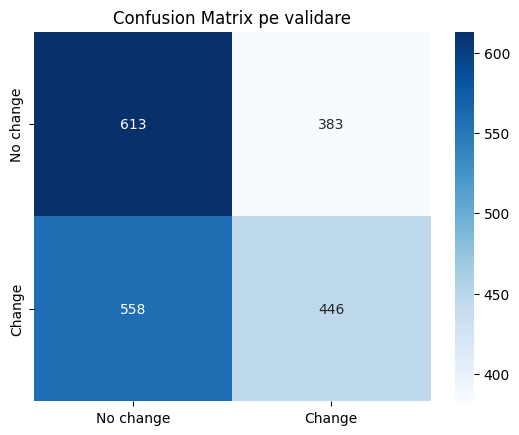

In [298]:
best = df_cand.iloc[0]
print("Best hyperparams:", best[['max_depth','min_samples_split','min_samples_leaf','val_accuracy']])

# modelul optim
best_tree = best['model']

# afișezi rapoartele de performanță
from sklearn.metrics import classification_report, confusion_matrix

y_val_pred = best_tree.predict(x_validation)
print(classification_report(y_validation.ravel(), y_val_pred,
                            target_names=['No change','Change']))

cm = confusion_matrix(y_validation.ravel(), y_val_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No change','Change'],
            yticklabels=['No change','Change'])
plt.title('Confusion Matrix pe validare')
plt.show()
